# 浜辺の侵食の様子を確認する

この章では、異なる時期の2つの九十九里浜の衛星データを取得し、海岸線を比較します。手順は以下の通りです。

- 衛星データを取得する
- 衛星データをプログラムに取り込む
- クラスタリングで陸と水域を分類する
- 海岸線を取得する
- 結果を確認する

In [ ]:
# Colab利用時はランタイムの再起動が必須
# ライブラリのインストール
!pip install geopandas
!pip install rasterio
!pip install sentinelsat
!pip install cartopy
!pip install fiona
!pip install shapely
!pip install pyproj
!pip install pygeos
!pip install rtree
!pip install sat-search
!pip install pystac-client

In [26]:
#必要ライブラリのインポート
import os
import numpy as np
import geopandas as gpd
import pandas as pd
import cartopy, pyproj, rtree, pygeos
import cv2

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
matplotlib.rcParams['figure.dpi'] = 250 # 解像度

import rasterio as rio
import folium
import zipfile
import glob
import shutil

from mpl_toolkits.axes_grid1 import make_axes_locatable
import fiona, shapely
from shapely.geometry import MultiPolygon, Polygon, box
from fiona.crs import from_epsg
import rasterio as rio
from rasterio import plot
from rasterio.plot import show
from rasterio.plot import plotting_extent
from rasterio.mask import mask
from osgeo import gdal
from PIL import Image
import requests
import json
from pystac_client import Client
from satsearch import Search
from io import BytesIO
import urllib
from skimage import io
import re

import warnings
warnings.filterwarnings('ignore')

print("done")

done


In [2]:
# Google Colabを使っている場合には、ドライブのマウントを行います
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


読み込み範囲を指定します。

この演習では、2019年2月中旬と2021年1月中旬の海岸線を比較します。

はじめに、2019年2月10日～2019年2月21日の衛星データを取得します。

In [54]:
# 取得範囲を指定するための関数を定義
def selSquare(minLon, minLat, maxLon, maxLat):
   c1 = [maxLon, maxLat]
   c2 = [maxLon, minLat]
   c3 = [minLon, minLat]
   c4 = [minLon, maxLat]
   geometry = {"type": "Polygon", "coordinates": [[ c1, c2, c3, c4, c1 ]]}
   return geometry

In [55]:
# 参照：https://automating-gis-processes.github.io/CSC18/lessons/L6/clipping-raster.html
# WGS84座標系を指定
dates = '2019-02-10/2019-02-21'
bbox = selSquare(140.3839874267578, 35.32184842037683, 140.7300567626953,35.706377408871774) # (min lon, min lat, max lon, max lat)

api_url = 'https://earth-search.aws.element84.com/v0'
collection = "sentinel-s2-l2a-cogs"  # Sentinel-2, Level 2A (BOA)
s2STAC = Client.open(api_url, headers=[])

s2Search = s2STAC.search (
   intersects = bbox,
   datetime = dates,
  #  query = {"eo:cloud_cover": {"lt": 10}, "sentinel:valid_cloud_cover": {"eq": True}},
   collections = collection)

s2_items = [i.to_dict() for i in s2Search.get_items()]
print(f"{len(s2_items)} のシーンを取得")

items = s2Search.get_all_items()
df = gpd.GeoDataFrame.from_features(items.to_dict(), crs="epsg:4326")
# 雲量で並び替え
s2Gdf = df.sort_values('eo:cloud_cover').reset_index(drop=True)
s2Gdf.head()

4 のシーンを取得


,geometry,created,sentinel:product_id,sentinel:sequence,view:off_nadir,sentinel:valid_cloud_cover,platform,sentinel:utm_zone,proj:epsg,sentinel:grid_square,datetime,instruments,constellation,eo:cloud_cover,gsd,sentinel:latitude_band,sentinel:data_coverage,updated,data_coverage
0,"POLYGON ((139.90172 35.14992, 139.88809 36.139...",2020-09-30T03:06:46.209Z,S2B_MSIL2A_20190212T012759_N0211_R074_T54SVE_2...,0,0,True,sentinel-2b,54,32654,VE,2019-02-12T01:37:18Z,[msi],sentinel-2,0.63,10,S,92.38,2020-09-30T03:06:46.209Z,92.38
1,"POLYGON ((139.90172 35.14992, 139.88809 36.139...",2020-08-30T02:08:39.082Z,S2A_MSIL2A_20190217T012721_N0211_R074_T54SVE_2...,0,0,True,sentinel-2a,54,32654,VE,2019-02-17T01:37:14Z,[msi],sentinel-2,66.48,10,S,92.44,2020-08-30T02:08:39.082Z,NaN
2,"POLYGON ((140.06111 35.15126, 140.06110 35.151...",2020-09-25T01:36:49.109Z,S2A_MSIL2A_20190214T011741_N0211_R031_T54SVE_2...,0,0,True,sentinel-2a,54,32654,VE,2019-02-14T01:27:18Z,[msi],sentinel-2,99.69,10,S,75.01,2020-09-25T01:36:49.109Z,75.01
3,"POLYGON ((140.06176 35.15127, 140.06176 35.151...",2020-08-28T23:15:35.870Z,S2B_MSIL2A_20190219T011709_N0211_R031_T54SVE_2...,0,0,True,sentinel-2b,54,32654,VE,2019-02-19T01:27:21Z,[msi],sentinel-2,100.00,10,S,74.96,2020-08-28T23:15:35.870Z,NaN


In [56]:
def getPreview(thumbList, r_num, c_num, figsize_x=12, figsize_y=12):
  """
  サムネイル画像を指定した引数に応じて行列状に表示
  r_num: 行数
  c_num: 列数
  """
  thumbs = thumbList
  f, ax_list = plt.subplots(r_num, c_num, figsize=(figsize_x,figsize_y))
  for row_num, ax_row in enumerate(ax_list):
    for col_num, ax in enumerate(ax_row):
      if len(thumbs) < r_num*c_num:
        len_shortage = r_num*c_num - len(thumbs) # 行列の不足分を算出
        count = row_num * c_num + col_num
        if count < len(thumbs):
          ax.label_outer() # サブプロットのタイトルと、軸のラベルが被らないようにします
          ax.imshow(io.imread(thumbs[row_num * c_num + col_num]))
          ax.set_title(thumbs[row_num * c_num + col_num][60:79])
        else:
          for i in range(len_shortage):
            blank = np.zeros([100,100,3],dtype=np.uint8)
            blank.fill(255)
            ax.label_outer()
            ax.imshow(blank)
      else:
        ax.label_outer()
        ax.imshow(io.imread(thumbs[row_num * c_num + col_num]))
        ax.set_title(thumbs[row_num * c_num + col_num][60:79])
  return plt.show()

In [57]:
allthumbUrl = []
for item in items:
  allthumbUrl.append(item.assets['thumbnail'].href)

len(allthumbUrl)

4

In [ ]:
# 2017年のサムネイル画像を描画
getPreview(allthumbUrl,2,2,5,5)

解像度が10mである撮影データ、AOT, WVP, B02, B03, B04, B08を取得しましょう。

In [58]:
# 画像を保存するディレクトリの作成
os.makedirs('R10m_2019',exist_ok=True)
os.makedirs('R10m_2021',exist_ok=True)

取得したURLから画像をダウンロードします。

In [59]:
# 最も雲の量が少ないシーンを選択し、サムネイル画像も取得する関数を定義します。
def sel_items(scene_items, product_id):
 item = [x.assets for x in scene_items\
         if x.properties['sentinel:product_id'] == product_id]
 thumbUrl = [x.assets['thumbnail'].href for x in scene_items\
             if x.properties['sentinel:product_id'] == product_id]
 return item, thumbUrl

selected_item, thumbUrl = sel_items(items, s2Gdf['sentinel:product_id'][0])

# thumbImg = Image.open(BytesIO(requests.get(thumbUrl[0]).content))
# plt.figure(figsize=(5,5))
# plt.imshow(thumbImg)

In [60]:
# 引用：https://note.nkmk.me/python-download-web-images/
def download_file(url, dst_path):
  print(url)
  try:
    with urllib.request.urlopen(url) as web_file, open(dst_path, 'wb') as local_file:
      local_file.write(web_file.read())
  except urllib.error.URLError as e:
    print(e)

def download_file_to_dir(url, dst_dir):
   download_file(url, os.path.join(dst_dir, os.path.basename(url)))

In [62]:
bandLists = ['B08','B04','B03','B02','AOT','WVP']

# 画像のURL取得
file_url = []
[file_url.append(selected_item[0][band].href) for band in bandLists if file_url.append(selected_item[0][band].href) is not None]

# 画像のダウンロード
dst_dir = '/content/R10m_2019'
[download_file_to_dir(link, dst_dir) for link in file_url if download_file_to_dir(link, dst_dir) is not None]

https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/VE/2019/2/S2B_54SVE_20190212_0_L2A/B08.tif
https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/VE/2019/2/S2B_54SVE_20190212_0_L2A/B04.tif
https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/VE/2019/2/S2B_54SVE_20190212_0_L2A/B03.tif
https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/VE/2019/2/S2B_54SVE_20190212_0_L2A/B02.tif
https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/VE/2019/2/S2B_54SVE_20190212_0_L2A/AOT.tif
https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/VE/2019/2/S2B_54SVE_20190212_0_L2A/WVP.tif


[]

同様に、2021年1月10日～2021年1月15のデータも取得します。

In [63]:
# 日付の指定
dates = '2021-01-10/2021-01-15'
s2STAC = Client.open(api_url, headers=[])

s2Search = s2STAC.search (
   intersects = bbox,
   datetime = dates,
  #  query = {"eo:cloud_cover": {"lt": 10}, "sentinel:valid_cloud_cover": {"eq": True}},
   collections = collection)

s2_items = [i.to_dict() for i in s2Search.get_items()]
print(f"{len(s2_items)} のシーンを取得")

items = s2Search.get_all_items()
df = gpd.GeoDataFrame.from_features(items.to_dict(), crs="epsg:4326")
# 雲量で並び替え
s2Gdf = df.sort_values('eo:cloud_cover').reset_index(drop=True)
s2Gdf.head()

selected_item, thumbUrl = sel_items(items, s2Gdf['sentinel:product_id'][0])

# 取得するバンドの選択
bandLists = ['B08','B04','B03','B02','AOT','WVP']

# 画像のURL取得
file_url = []
[file_url.append(selected_item[0][band].href) for band in bandLists if file_url.append(selected_item[0][band].href) is not None]

# 画像のダウンロード
dst_dir = '/content/R10m_2021'
[download_file_to_dir(link, dst_dir) for link in file_url if download_file_to_dir(link, dst_dir) is not None]

3 のシーンを取得
https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/VE/2021/1/S2A_54SVE_20210114_0_L2A/B08.tif
https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/VE/2021/1/S2A_54SVE_20210114_0_L2A/B04.tif
https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/VE/2021/1/S2A_54SVE_20210114_0_L2A/B03.tif
https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/VE/2021/1/S2A_54SVE_20210114_0_L2A/B02.tif
https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/VE/2021/1/S2A_54SVE_20210114_0_L2A/AOT.tif
https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/VE/2021/1/S2A_54SVE_20210114_0_L2A/WVP.tif


[]

衛星データをPythonのプログラムに取り込みます。このように複数のデータを比較する場合、データを管理するクラスを作成しておくと便利です。今回は以下のようなクラスを作成します。

In [64]:
class Region:
    # コンストラクタ
    # pathの例 ：'./content/R10m_2019/B02.tif'
    # bandsの例：['B02','B03','B04','B08','AOT','WVP']
    #            B02青、B03緑、B04赤、B08近赤外線は必須
    def __init__(self, path, bands=['B02','B03','B04','B08']):
        self.path = path
        self.bands = bands
        self.dataset = self._load_satellite_data(path, bands)

    # 衛星データを読み込んで辞書として返す
    def _load_satellite_data(self, path, bands):
        return {b:(rio.open(path.format(b)).read())[0] for b in bands}

    # 領域を切り抜いてreginに代入する
    def set_region(self, geojson_file):
        self.region = self._get_region(geojson_file, self.path, self.bands)

    # 領域を切り抜いて辞書として返す
    def _get_region(self, geojson_file, path, bands):
        # GeoJSONファイルをGeoPandasで読み込む
        gpd1 = gpd.read_file(geojson_file)

        # EPGSの仕様に適した形式へGeoJSONデータを変換する
        gpd1_crs = gpd1.to_crs({'init': rio.open(path.format('B02')).crs})

        _region = {}

        # 画像を切り抜いてout_imageに入れる
        for b in bands:
            img, _ = rio.mask.mask(rio.open(path.format(b)), gpd1_crs.geometry, crop=True)
            _region[b] = img[0]

        return _region

    # ガンマ補正を行う関数
    def _gamma_correction(self, image, gamma=3.0):
        # 整数型で2次元配列を作成[256,1]
        lookup_table = np.zeros((256, 1), dtype = 'uint8')
        for i in range(256):
            # γテーブルを作成
            lookup_table[i][0] = 255 * (float(i) / 255) ** (1.0/gamma)

        # lookup Tableを用いて配列を変換
        return cv2.LUT(image, lookup_table)

    # 与えられたデータをもとにカラー画像を返す
    def get_rgb_image(self, dataset):
        # B02,03,04を合成したBGR形式の画像を用意する
        bgr = np.zeros((dataset['B02'].shape[0], dataset['B02'].shape[1], 3), dtype=np.uint8)

        for i, b in enumerate(self.bands[:3]):
            bgr[:, :, i] = dataset[b] // 256

        # HSV形式に変換する
        hsv = cv2.cvtColor(bgr, cv2.COLOR_BGR2HSV)

        # V（明度）をB08のデータで置き換える
        hsv[:, :, 2] = dataset['B08'] // 256

        # Vを置き換えたデータを再びBGR形式に置き換える
        rgb = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

        # ガンマ補正を実施
        return self._gamma_correction(rgb)

このクラスのオブジェクトは以下の変数と関数で構成されます。「後で追加」と書いている変数は、上記のソースコードには定義していないが以降のソースコードで追加される変数です。

**Regionクラス**

変数
- path：ファイルパス
- bands：バンドを保持するリスト
- dataset：衛星データを保持する辞書
- region：GeoJSONに対応する領域を保持する辞書
- region_reshaped：クラスタリング用に2次元へreshapeした領域データ（後で追加）
- region_predict：クラスタリングした結果（後で追加）
- region_blurred：クラスタリング結果にガウスフィルタを適用したもの（後で追加）
- region_edge：エッジ（後で追加）

関数
- init：コンストラクタ
- set_region：領域を切り抜いてself.regionに代入する
- get_rgb_image：与えられたデータをもとにカラー画像を返す

内部関数（このオブジェクトの中でのみ利用される関数）
- _load_satellite_data：[内部関数]衛星データを読み込んで辞書として返す
- _get_region：領域を切り抜いて辞書として返す
- _gamma_correction：ガンマ補正をする関数
- Regionクラスのソースコードについて説明します。

*ガンマ補正とは、各ピクセルの値に特定の式をあてはめて計算する方法で、輝度や色の値と実際の表示の濃さとの関係を、直線的ではなく曲線的に変換します。簡単に色味の補正と考えてください。詳しくは、http://rs.aoyaman.com/seminar/about10.html をご覧ください。

```python
# コンストラクタ
    # pathの例：'./content/R10m_2019/B02.tif'
    # bandsの例：['B02','B03','B04','B08','AOT','TCI','WVP']
    #            B02青、B03緑、B04赤、B08近赤外線は必須
    def __init__(self, path, bands=['B02','B03','B04','B08']):
        self.path = path
        self.bands = bands
        self.dataset = self._load_satellite_data(path, bands)
```

クラスを実体化してオブジェクトにするコンストラクタは、pathとbandsを引数として取ります。bandsは省略可能です。

- path：衛星データのファイル名を相対パスで指定します。ファイル名のバンドによって変わる部分を {} としています
- bands：当オブジェクトで保持する衛星データのバンドを指定します。この衛星データを使ってクラスタリングを行います。初期値で4つのバンドを指定していますが増やすことも可能です

```python
# 衛星データを読み込んで辞書として返す
    def _load_satellite_data(self, path, bands):
        return {b:(rio.open(path.format(b)).read())[0] for b in bands}

    # 領域を切り抜いてreginに代入する
    def set_region(self, geojson_file):
        self.region = self._get_region(geojson_file, self.path, self.bands)
```

Regionオブジェクトでは、衛星データや領域を辞書型で保持します。以下のようなイメージです。

```python
{
  'B02': B02に対応した衛星データ,
  'B03': B03に対応した衛星データ,
  'B04': B04に対応した衛星データ, ...
}
```

それでは、衛星データを取得しましょう。衛星データを管理するオブジェクトを作成し、regionリストに追加します。以降のプログラムでは、それぞれのオブジェクトに対して同じ処理を行うため、リストで保持しておくとプログラムを簡潔に書くことができます。

In [65]:
# 衛星データの取得
region = []
region.append(Region('/content/R10m_2019/{}.tif'))
region.append(Region('/content/R10m_2021/{}.tif'))

In [66]:
# 参照：https://automating-gis-processes.github.io/CSC18/lessons/L6/clipping-raster.html
# WGS84座標系を指定
bbox = box(140.3839874267578, 35.32184842037683, 140.7300567626953,35.706377408871774) # min lon, min lat, max lon, max lat
geo = gpd.GeoDataFrame({'geometry': bbox}, index=[0], crs=from_epsg(4326))
geo = geo.to_crs(crs='epsg:32649') # Sentinel-2の画像に合わせます
geo.to_file("kujukuri_hama.geojson", driver='GeoJSON')

In [67]:
# 領域の取得
for r in region:
  r.set_region('/content/kujukuri_hama.geojson')

取得した画像を表示してみましょう。

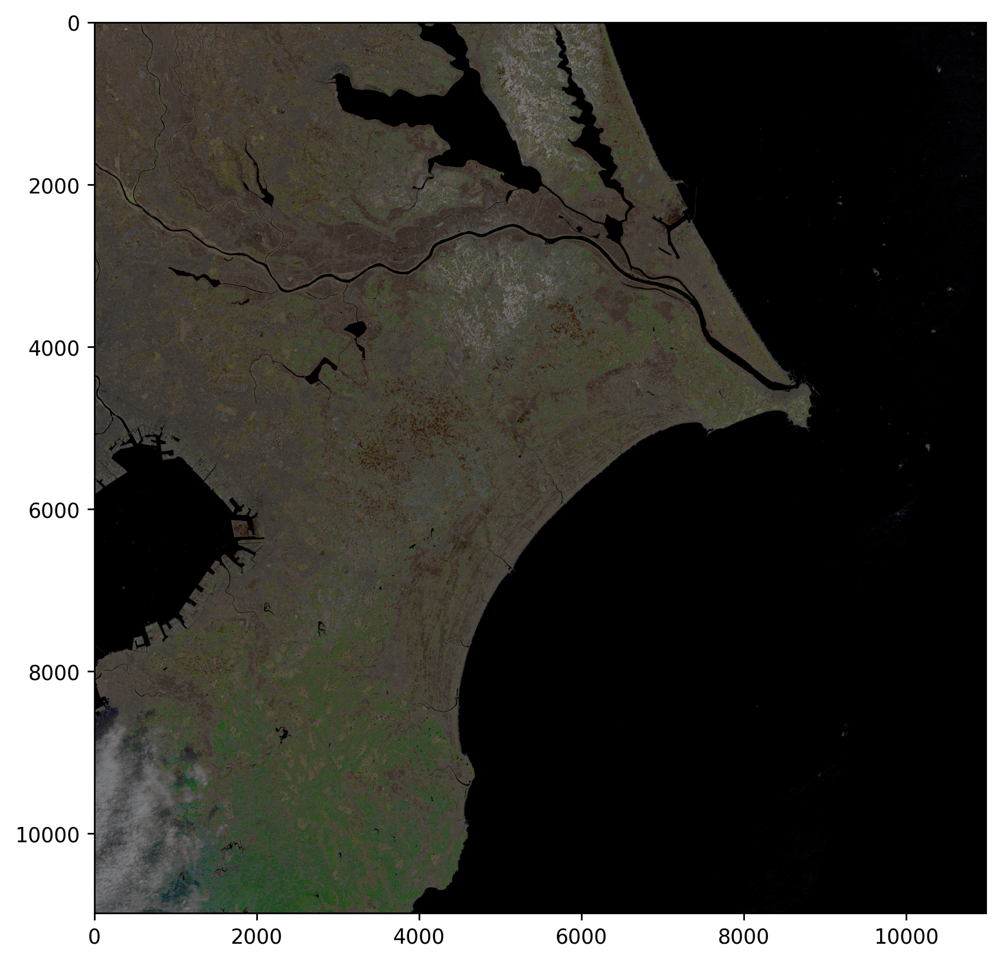

In [68]:
# 2019年
plt.figure(figsize=(8,8))
plt.imshow(region[0].get_rgb_image(region[0].dataset))

In [ ]:
# 2021年
plt.figure(figsize=(8,8))
plt.imshow(region[1].get_rgb_image(region[1].dataset))

Output hidden; open in https://colab.research.google.com to view.

続いて、切り出した画像を表示します。

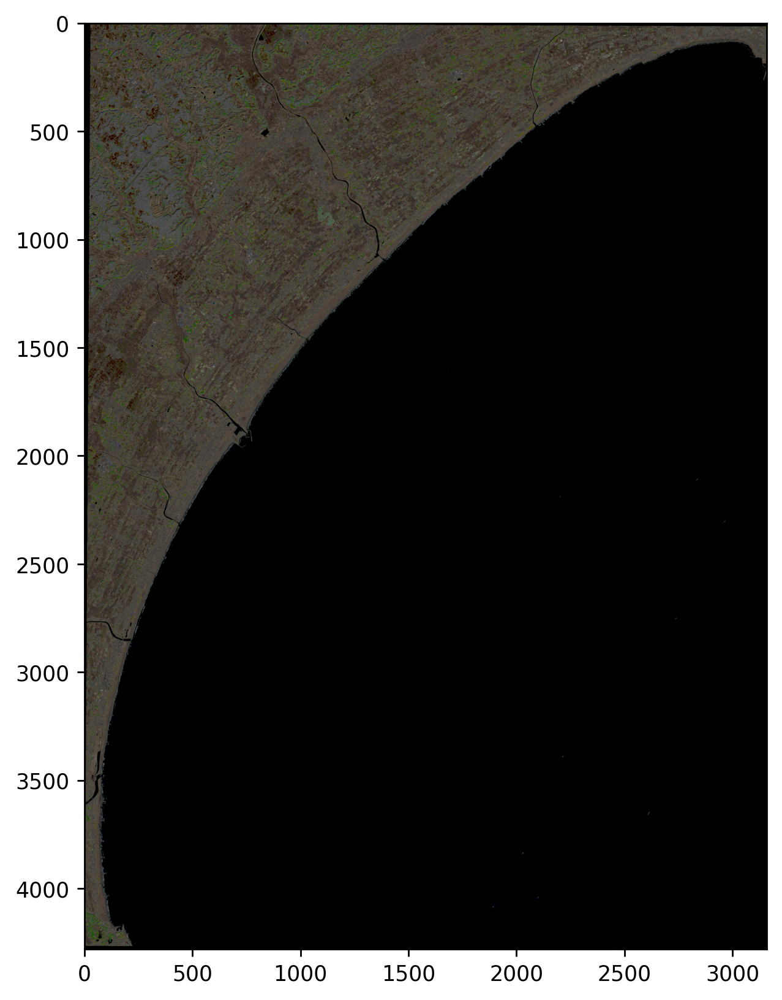

In [ ]:
# 2019年
plt.figure(figsize=(8,8))
plt.imshow(region[0].get_rgb_image(region[0].region))

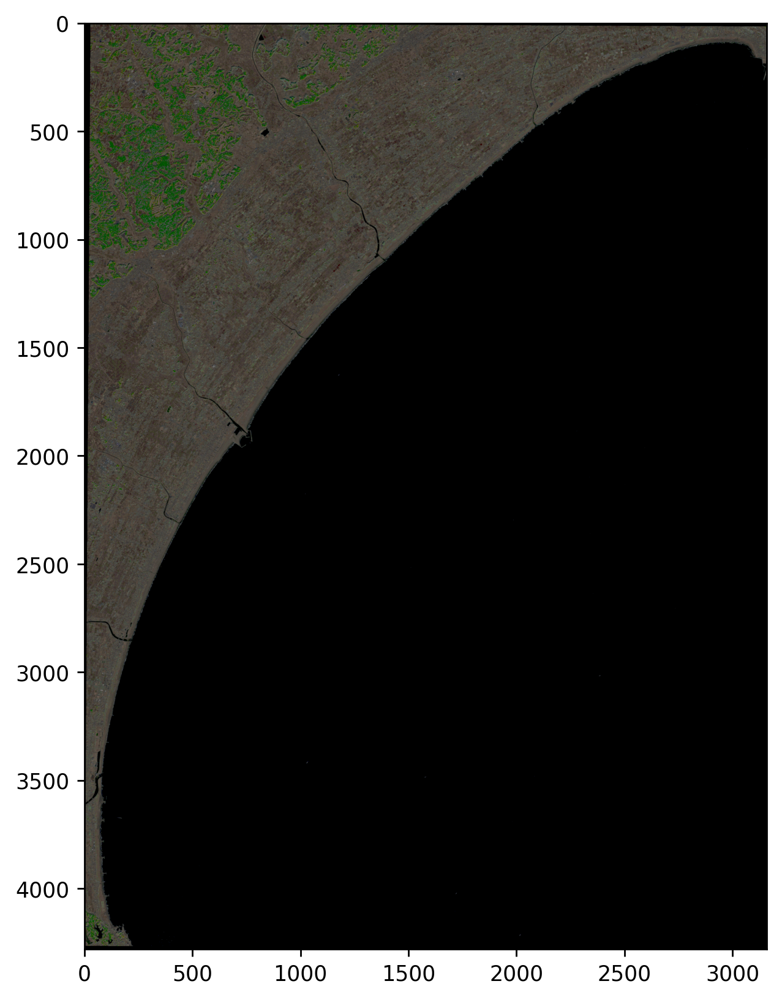

In [ ]:
# 2021年
plt.figure(figsize=(8,8))
plt.imshow(region[1].get_rgb_image(region[1].region))

## クラスタリングを行う

領域のデータを、クラスタリングによって陸と水域に分類します。領域のデータはバンド毎に（領域の高さ x 領域の幅）の2次元の形状で保持しています。これを「バンド数 X 領域のピクセル数」のNumpy配列に変換します。「領域のピクセル数＝領域の高さ x 領域の幅」です。これをさらに転置（行列入れ替え）して「領域のピクセル数 X バンド数」の形状にします。結果はRegionオブジェクトのregion_reshapedに格納します。

*仮に教科書の結果と見栄えが異なっている場合には、二つの時期がここでダウンロードしているものと完全に一致しているかを確認してください。時期の異なる画像でクラスタリングを行うと結果も変化します。

In [69]:
# クラスタリング用のデータを作成してオブジェクトに追加
for r in region:
  # 領域の辞書をNumpy配列に変換する
  tmp = np.array([r.region[b] for b in r.bands])
  print(tmp.shape)
  # 2次元にし、転置する（行と列を入れ替える）
  r.region_reshaped = tmp.reshape(len(tmp),-1).T
  print(r.region_reshaped.shape)

(4, 4280, 3159)
(13520520, 4)
(4, 4280, 3159)
(13520520, 4)


データが準備できたらクラスタリングを行います。今回はk-means++法というアルゴリズムでクラスタリングを行います。k-means法はクラスタリングの代表的なアルゴリズムで、グループ毎に中心点（シード）を置き、それにデータを所属させることでクラスタリングを行う方法です。以下のサイトでk-means法によるクラスタリングの方法を視覚的に確認できます。

ただし、k-means法のシードの初期値はランダムであるため、シードが偏って置かれた場合、クラスタリングが上手く行われないという問題点があります。そこで一般的にはk-means法を改良したk-means++法がよく使われます。k-means++法はシードの初期値をランダムではなく、なるべく離れるように置くことで、偏りを防ぎます。

まずは、必要なライブラリを読み込みます。

参考：[k-means法によるクラスタリング](http://tech.nitoyon.com/ja/blog/2013/11/07/k-means/)



In [70]:
# 必要なライブラリの読込
from sklearn.cluster import KMeans

データの特徴をクラスタリングを行うモデルに覚えさせることを「学習」と言います。

学習を実施します。今回は陸と水域の2つに分類するため、クラスタ数「n_clusters」は2にします。

In [71]:
# 学習の実施
models = []

for r in region:
  print("Fitting model")
  model = KMeans(n_clusters=2, init='k-means++', n_init=10)
  model.fit(r.region_reshaped)
  models.append(model)
  print("Done")

# 領域の大きさを取得
height = region[0].region['B02'].shape[0]
width = region[0].region['B02'].shape[1]
print(height, width)

# クラスタリングを実施し、結果をregion_predictに代入する
for r, model in zip(region, models):
  r.region_predict = model.predict(r.region_reshaped).reshape(height, width)

Fitting model
Done
Fitting model
Done
4280 3159


学習したモデルを使い、データを分類します。分類結果は（領域の高さ x 領域の幅）の2次元の形状にしてRegionオブジェクトのregion_predict変数に格納します。

In [72]:
# 2019年と2021年を結合したデータで学習を実施する
train = np.append(region[0].region_reshaped, region[1].region_reshaped, axis=0)
print(train.shape)

# 学習の実施
model = KMeans(n_clusters=2, init='k-means++', n_init=10)
model.fit(train)

# 領域の大きさを取得
height = region[0].region['B02'].shape[0]
width = region[0].region['B02'].shape[1]
print(height, width)

# クラスタリングを実施し、結果をregion_predictに代入する
for r in region:
    r.region_predict = model.predict(r.region_reshaped).reshape(height, width)

(27041040, 4)
4280 3159


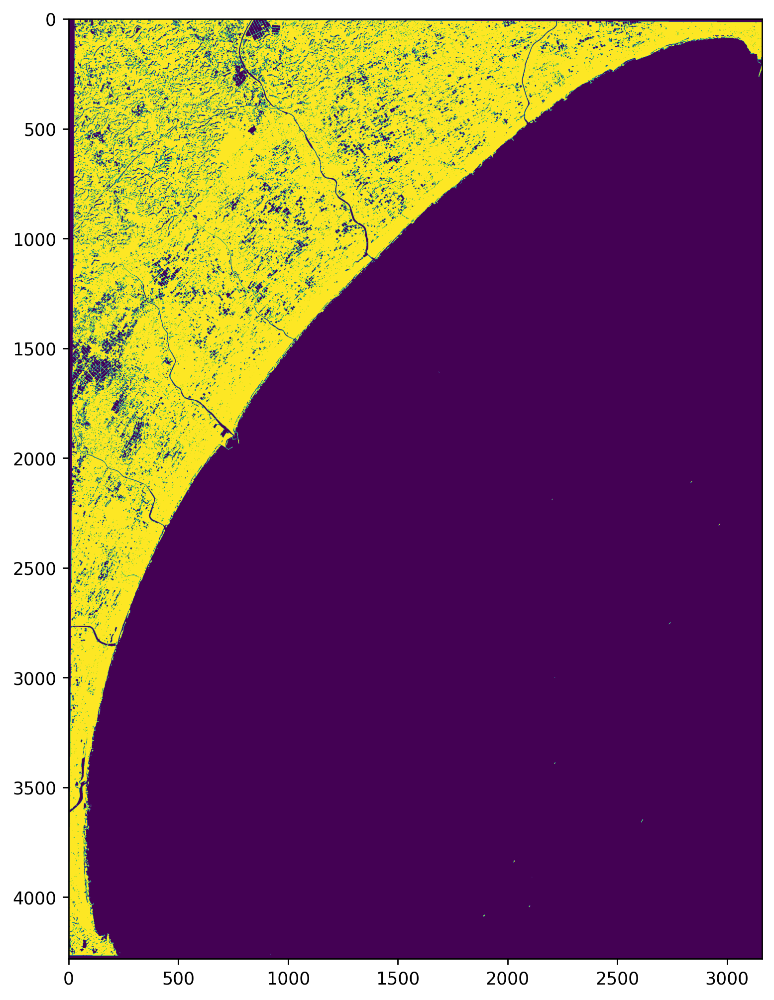

In [73]:
# 2019年
plt.figure(figsize=(10,10))
plt.imshow(region[0].region_predict)
# plt.imshow(region[0].region_predict, cmap="tab20_r")

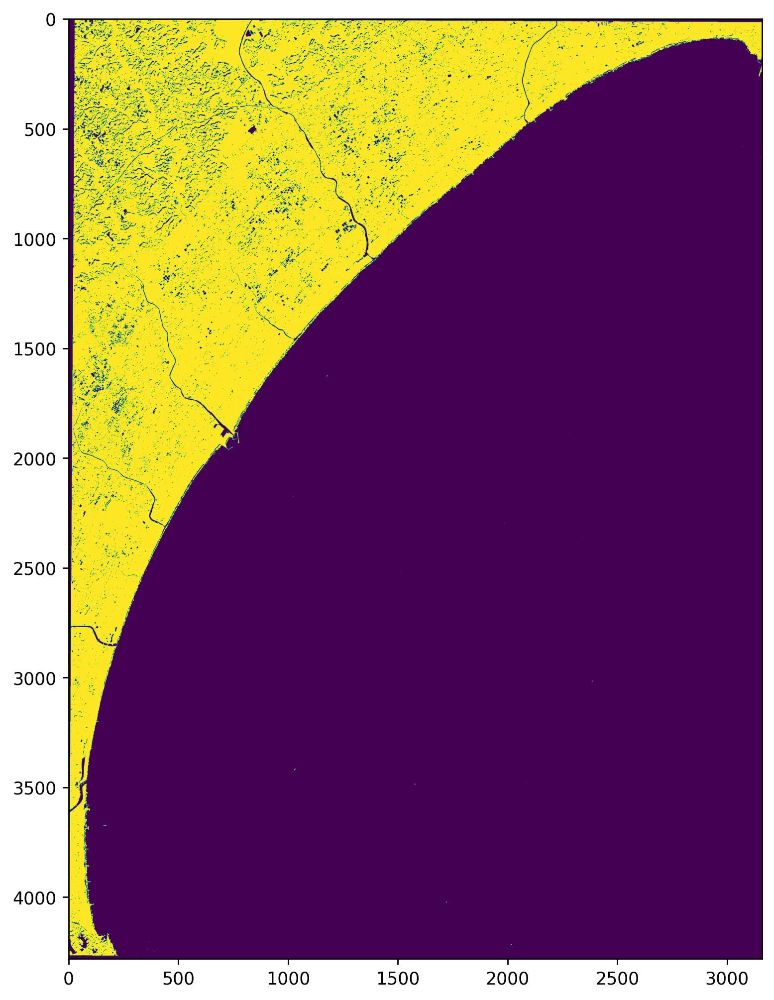

In [74]:
# 2021年
plt.figure(figsize=(10,10))
plt.imshow(region[1].region_predict)
# plt.imshow(region[1].region_predict, cmap="tab20_r")

最後に画像のノイズを除去します。ノイズ除去で多く用いられているガウスフィルタを使用します。ノイズ除去した結果はRegionオブジェクトのregion_blurred変数に格納します。

In [75]:
# https://plantcv.readthedocs.io/en/v2.0/gaussian_blur/
for r in region:
    tmp = r.region_predict.astype("uint8")
    r.region_blurred = cv2.GaussianBlur(tmp, (101,101), 0)

ガウスフィルタを適用した結果を確認しましょう。

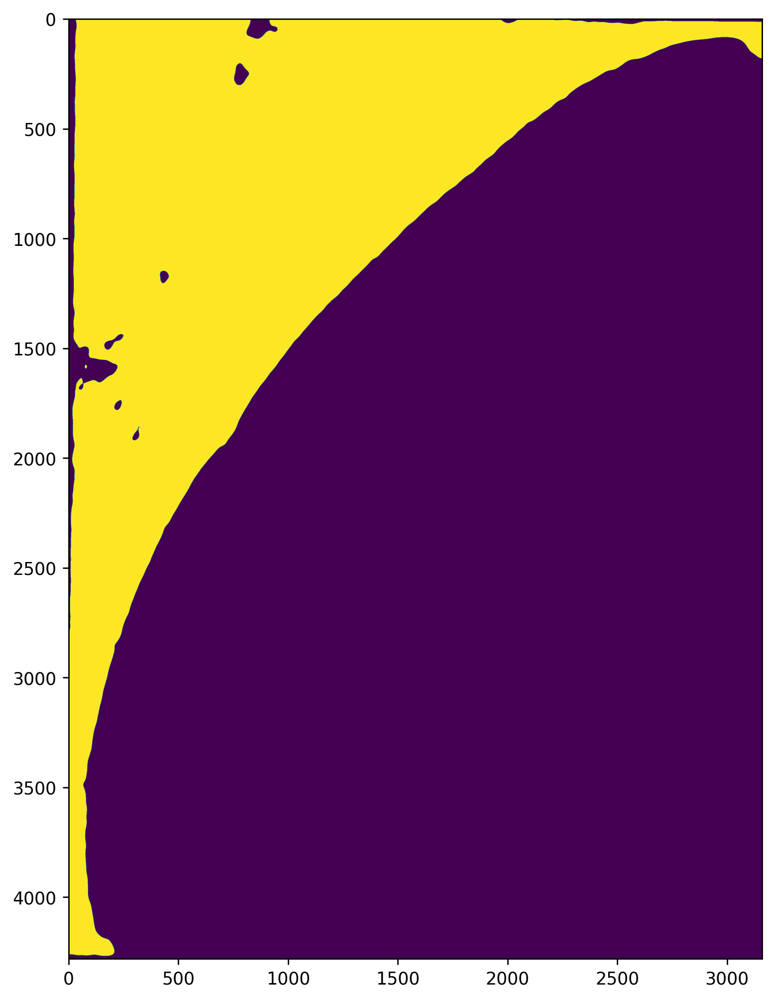

In [76]:
# 2019年
plt.figure(figsize=(10,10))
plt.imshow(region[0].region_blurred)
# plt.imshow(region[0].region_blurred, cmap="tab20_r")

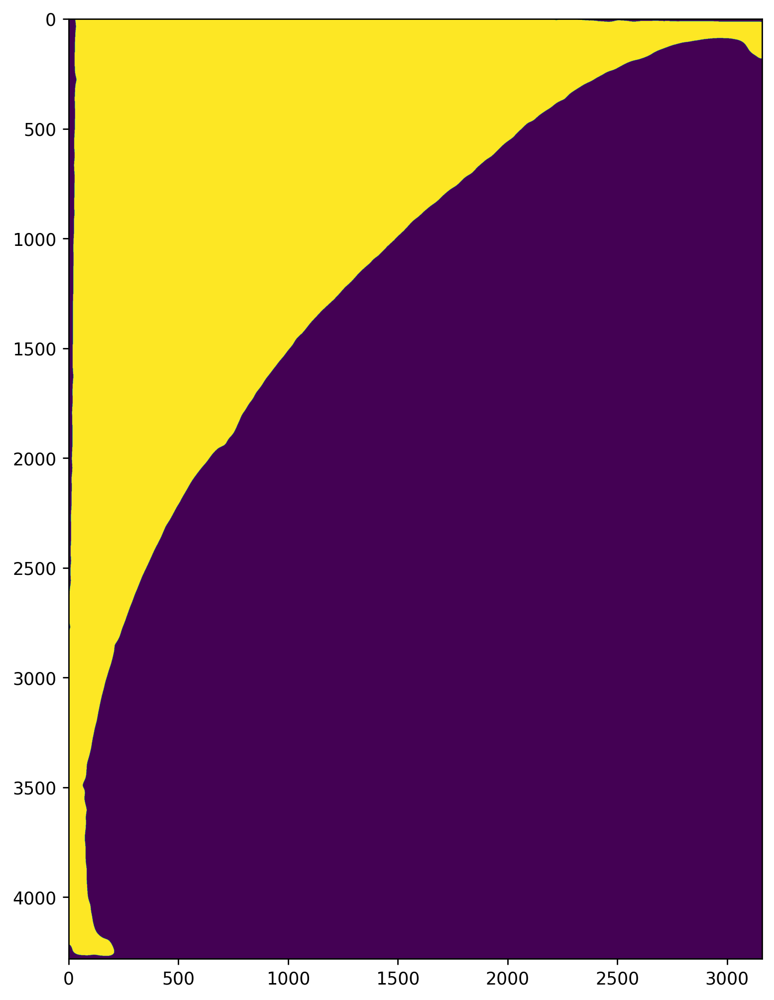

In [77]:
# 2021年
plt.figure(figsize=(10,10))
plt.imshow(region[1].region_blurred)
# plt.imshow(region[1].region_blurred, cmap="tab20_r")

2019年、2021年の分類結果の差分画像を作成してみましょう。2019年を変化前の参照画像として設定をし、どの場所が2021年と異なるのかを表示してみます。

In [78]:
# 差分画像の作成
## 参考：https://stackoverflow.com/questions/49239463/compare-two-binary-images-and-visualize-the-differences
from PIL import Image

def numpytoimage(numpy):
    numpy = numpy * 255
    image= Image.fromarray(numpy.astype(np.uint8))
    return image

reference = region[0].region_blurred # 参照画像：2019年
extract = region[1].region_blurred # 比較画像：2021年
# 差分画像作成用の配列を用意
C = np.zeros(shape=(len(reference), len(reference[0]), 3))

for i in range(0, reference.shape[0]):
  for j in range(0, reference.shape[1]):
    # どちらも水域（0）に分類
    if reference[i][j] == extract[i][j] and reference[i][j] == 0:
      C[i][j] = 1 # (R:255, G: 255, B:255)
    # 参照画像が水域に分類された場合
    elif reference[i][j] == 0:
      C[i][j][0] = 0
      C[i][j][1] = 1 # (G: 255)
      C[i][j][2] = 0
    # 比較画像が水域に分類された場合
    elif extract[i][j] == 0:
      C[i][j][0] = 1 # (R: 255)
      C[i][j][1] = 0
      C[i][j][2] = 0
    # どちらも陸域（1）に分類された場合 (R: 127, G:127, B:127)
    else: 
      C[i][j][0] = 0.5
      C[i][j][1] = 0.5
      C[i][j][2] = 0.5

C_image = numpytoimage(C)
C_image.save("diff.png")

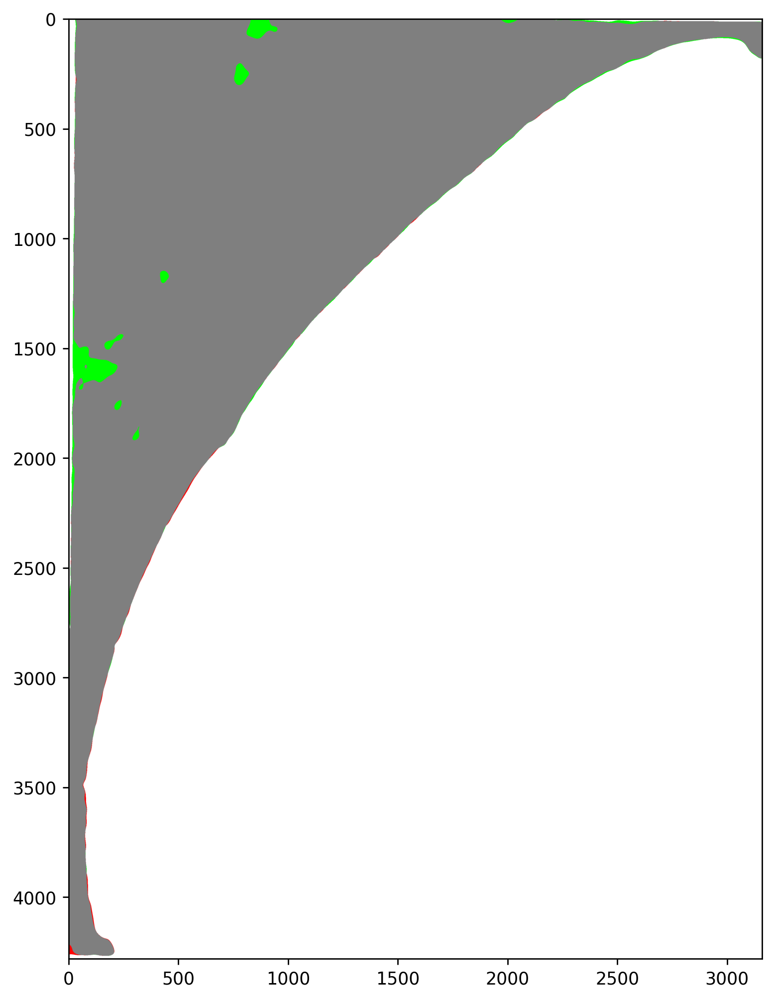

In [79]:
# 差分画像の表示。緑が2021では陸地とみなされた部分。赤は2019で陸地とみなされた部分となる
plt.figure(figsize=(10,10))
plt.imshow(C_image)
plt.show()

画像を分割して表示し、海岸線の変化を再確認します。

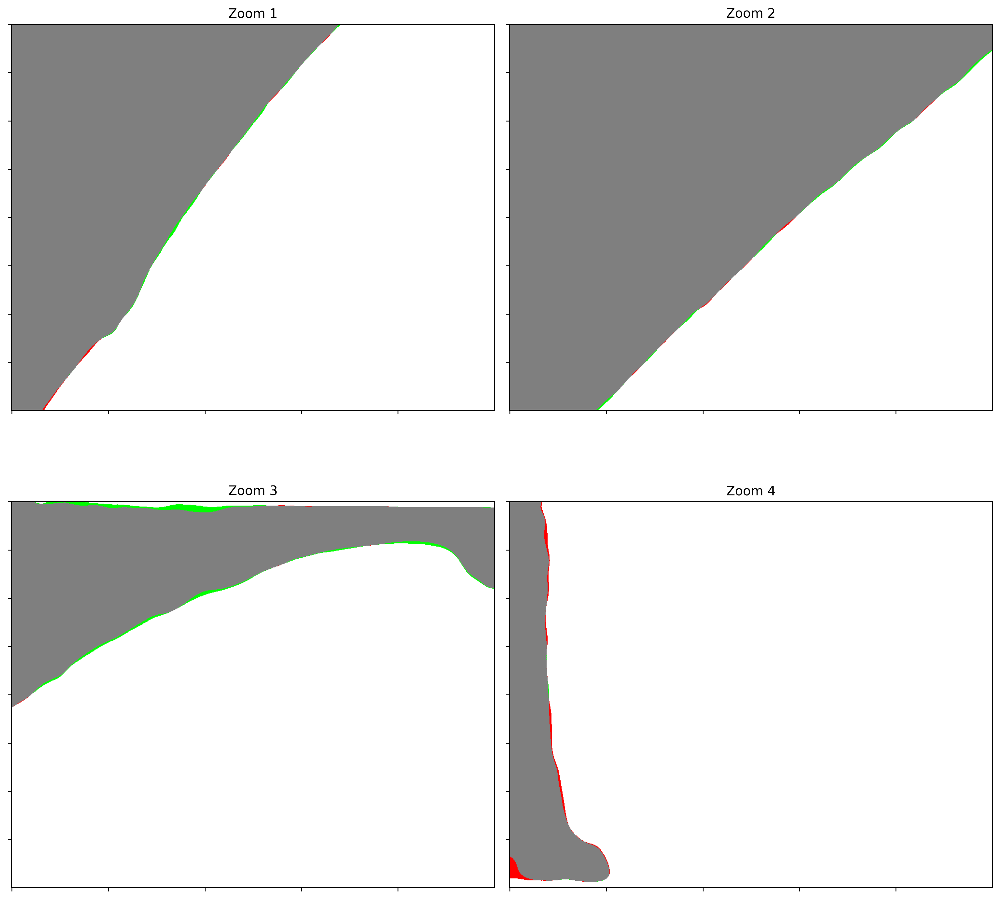

In [ ]:
fig, axs = plt.subplots(2,2,figsize=(13,13))

axs[0][0].imshow(region[0].get_rgb_image(region[0].region)[1300:2100, 500:1500])
axs[0][0].imshow(C[1300:2100, 500:1500])
axs[0][0].set_title('Zoom 1'), axs[0][0].set_xticklabels([]), axs[0][0].set_yticklabels([])

axs[0][1].imshow(region[0].get_rgb_image(region[0].region)[500:1300, 1000:2000])
axs[0][1].imshow(C[500:1300, 1000:2000])
axs[0][1].set_title('Zoom 2'), axs[0][1].set_xticklabels([]), axs[0][1].set_yticklabels([])

axs[1][0].imshow(region[0].get_rgb_image(region[0].region)[0:800, 2158:3158])
axs[1][0].imshow(C[0:800, 2158:3158])
axs[1][0].set_title('Zoom 3'), axs[1][0].set_xticklabels([]), axs[1][0].set_yticklabels([])

axs[1][1].imshow(region[0].get_rgb_image(region[0].region)[3479:4279, 0:1000])
axs[1][1].imshow(C[3479:4279, 0:1000])
axs[1][1].set_title('Zoom 4'), axs[1][1].set_xticklabels([]), axs[1][1].set_yticklabels([])

plt.tight_layout(); plt.show()

クラスタリングした結果のエッジを抽出することでも、海岸線を取得することが出来ます。今回はエッジを抽出するためにCanny法を利用します

In [ ]:
# https://qiita.com/shoku-pan/items/f87ccbde5fc320116e70
# エッジ膨張用
kernel = np.ones((15, 15))

for r in region:
    tmp = cv2.Canny(r.region_blurred, 2, 5).astype("float")
    # エッジを膨張させる
    tmp = cv2.dilate(tmp, kernel)
    tmp[tmp == 0] = np.nan
    r.region_edge = tmp

ソースコードについて説明します。

```python
tmp = cv2.Canny(r.region_blurred, 2, 5).astype("float")
```

エッジの抽出には前に取り上げたCanny法を使用します。

```python
# エッジを膨張させる
    tmp = cv2.dilate(tmp, kernel)
```

今回は、併せてエッジの膨張も行っています。エッジの膨張は前に取り上げたdilateを使っています。

```python
tmp[tmp == 0] = np.nan
```

エッジ以外のピクセルにはNaNを設定します。これによりエッジの画像を表示した際にエッジ以外の場所を透過させることができます。

エッジの抽出結果を確認しましょう。カラー画像に重ね合わせて表示します。


In [ ]:
# 2019年
# 検出したエッジの画像を表示
plt.figure(figsize=(15,15))
plt.imshow(region[0].get_rgb_image(region[0].region))
plt.imshow(region[0].region_edge, cmap="Set3_r")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# 2021年
# 検出したエッジの画像を表示
plt.figure(figsize=(15,15))
plt.imshow(region[1].get_rgb_image(region[1].region))
plt.imshow(region[1].region_edge, cmap="Set1")

Output hidden; open in https://colab.research.google.com to view.

エッジが抽出されたいるのがわかるでしょうか。

最後に2019年と2021年の海岸線を重ね合わせて変化を確認しましょう。なお、savefig関数で結果を画像として保存できます。

In [ ]:
# 検出したエッジの画像を表示
plt.figure(figsize=(15,15))
plt.imshow(region[0].get_rgb_image(region[0].region))
plt.imshow(region[0].region_edge, cmap="Set3_r")
plt.imshow(region[1].region_edge, cmap="Set1")
# 結果を画像として保存する
# plt.savefig('edge.png')

Output hidden; open in https://colab.research.google.com to view.

結果のX軸、Y軸の値はピクセル数です。この値を参考にして、いくつかの領域を抜き出して拡大してみましょう。

In [ ]:
# エッジ膨張用
kernel = np.ones((6, 6))

for r in region:
    tmp = cv2.Canny(r.region_blurred, 2, 5).astype("float")
    # エッジを膨張させる
    tmp = cv2.dilate(tmp, kernel)
    tmp[tmp == 0] = np.nan
    r.region_edge = tmp

In [ ]:
# 検出したエッジの画像を表示
plt.figure(figsize=(10,10))
plt.imshow(region[0].get_rgb_image(region[0].region)[1300:2100, 500:1500])
plt.imshow(region[0].region_edge[1300:2100, 500:1500], cmap="Set3_r")
plt.imshow(region[1].region_edge[1300:2100, 500:1500], cmap="Set1")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# 検出したエッジの画像を表示
plt.figure(figsize=(10,10))
plt.imshow(region[0].get_rgb_image(region[0].region)[500:1300, 1000:2000])
plt.imshow(region[0].region_edge[500:1300, 1000:2000], cmap="Set3_r")
plt.imshow(region[1].region_edge[500:1300, 1000:2000], cmap="Set1")

Output hidden; open in https://colab.research.google.com to view.

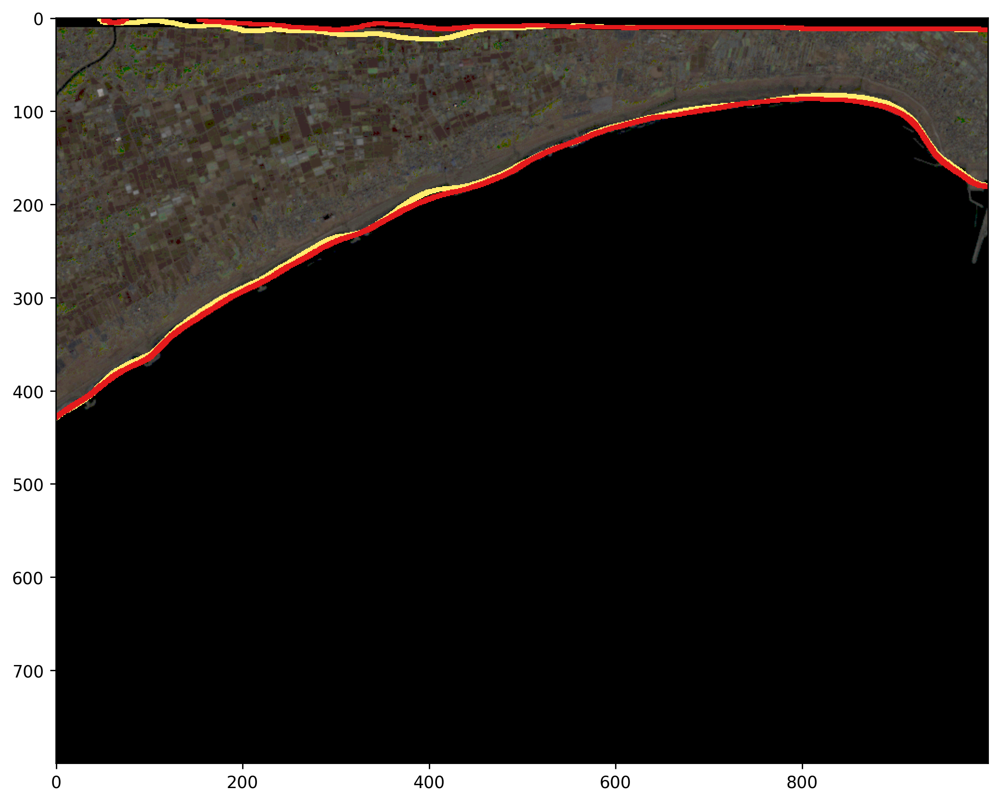

In [ ]:
# 検出したエッジの画像を表示
plt.figure(figsize=(10,10))
plt.imshow(region[0].get_rgb_image(region[0].region)[0:800, 2158:3158])
plt.imshow(region[0].region_edge[0:800, 2158:3158], cmap="Set3_r")
plt.imshow(region[1].region_edge[0:800, 2158:3158], cmap="Set1")

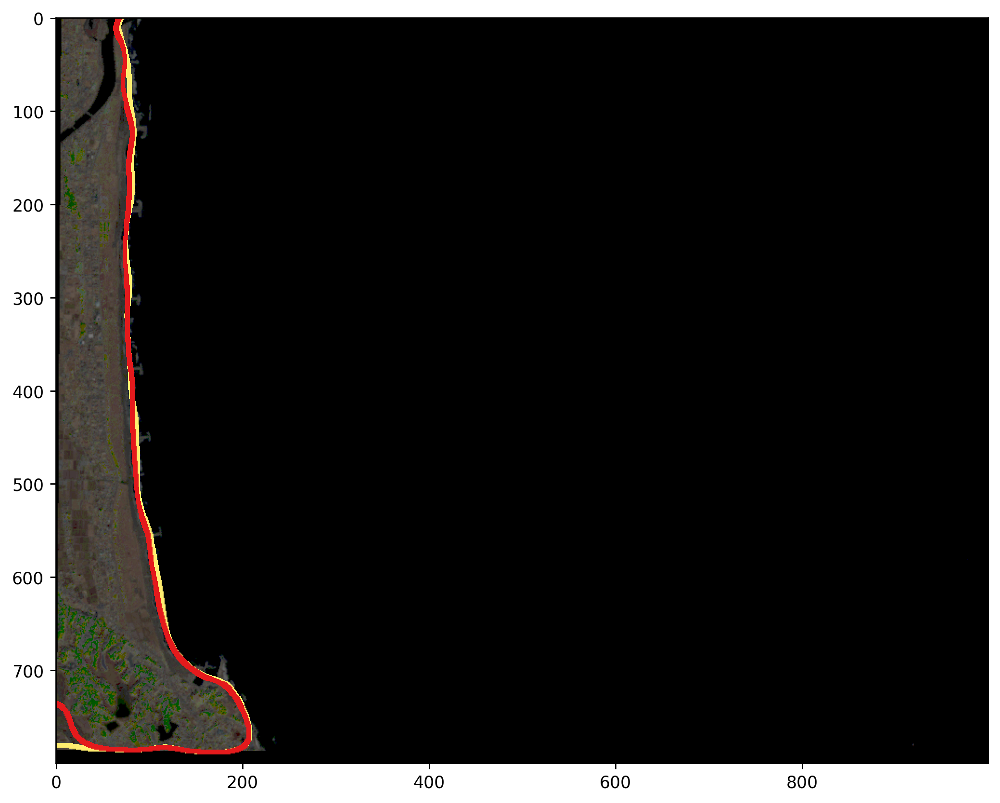

In [ ]:
# 検出したエッジの画像を表示
plt.figure(figsize=(10,10))
plt.imshow(region[0].get_rgb_image(region[0].region)[3479:4279, 0:1000])
plt.imshow(region[0].region_edge[3479:4279, 0:1000], cmap="Set3_r")
plt.imshow(region[1].region_edge[3479:4279, 0:1000], cmap="Set1")

2019年（黄色）と2020年（赤色）を比較すると、ある場所では浜辺の浸食が進み、ある場所では拡大しているように見えます。

このように衛星データとクラスタリング、Canny法によるエッジ検出を組み合わせることで、とてもきれいに海岸線を抽出できました。

今回作成したRegionクラスには簡単にバンドを追加できます。バンドを追加してクラスタリングの性能が向上するか試してみましょう。また、他の地域の衛星データを使った海岸線や水域（湖や河川など）の抽出にもチャレンジしてみましょう。なるべく雲がかかっていない衛星データを選ぶようにすると、より良好な結果が得られます。